

 neu_129523-highres.jpg  size:  (1180, 947, 3)


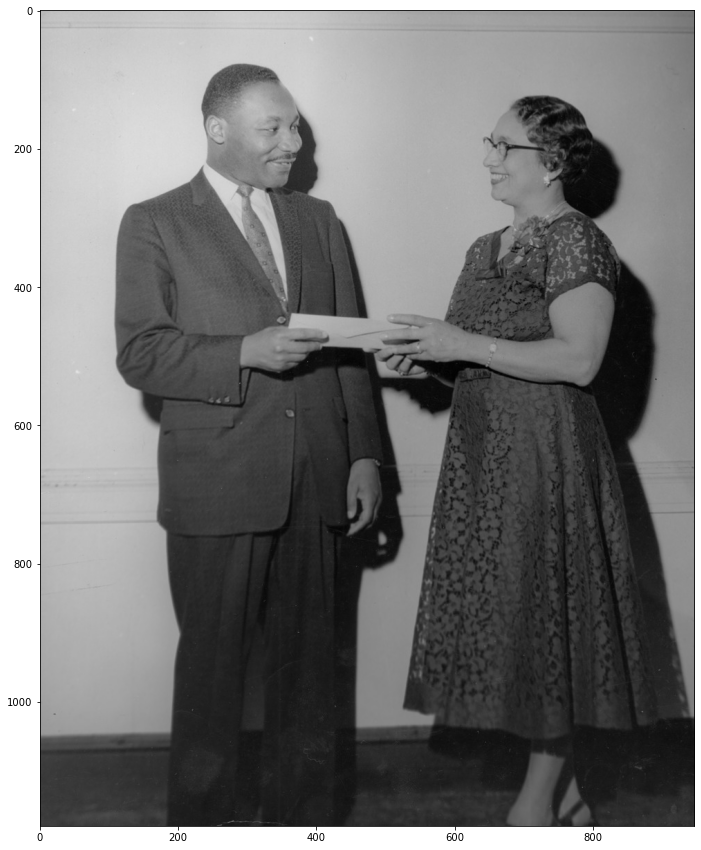



Detector Model Used:  opencv
Face Detection Confidence score:  0
Model Run Time:  0.12  seconds


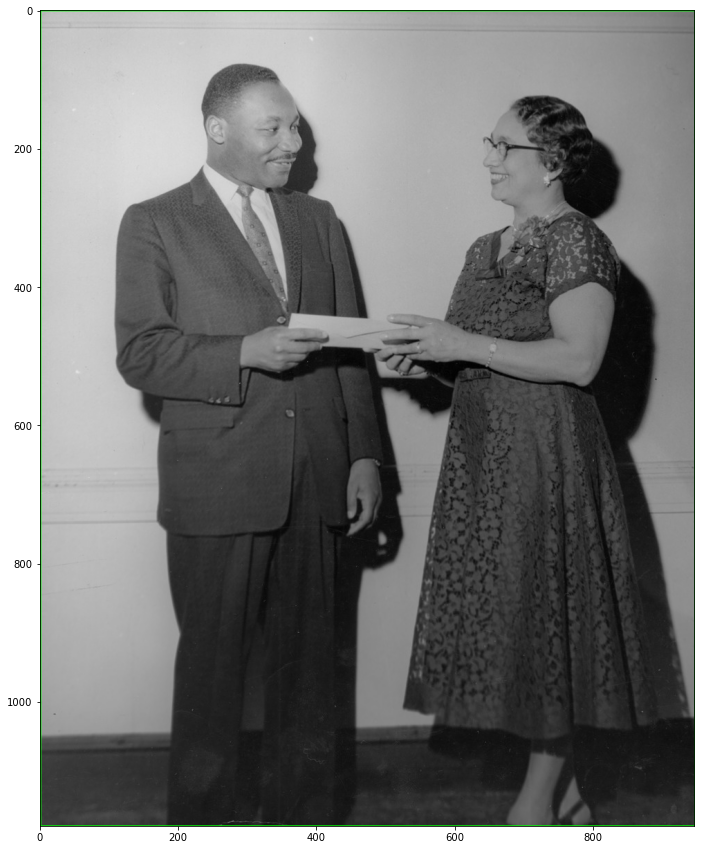



Detector Model Used:  ssd
Face Detection Confidence score:  0
Model Run Time:  0.04  seconds


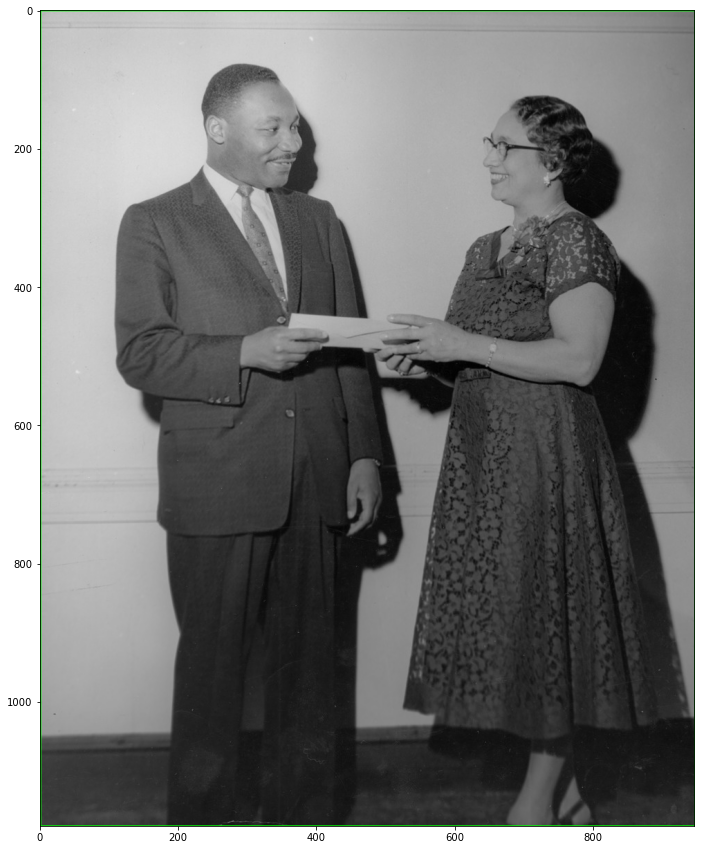



Detector Model Used:  mtcnn
1/1 [==============================] - 0s 23ms/step
Face Detection Confidence score:  0.9996596574783325
Model Run Time:  0.98  seconds


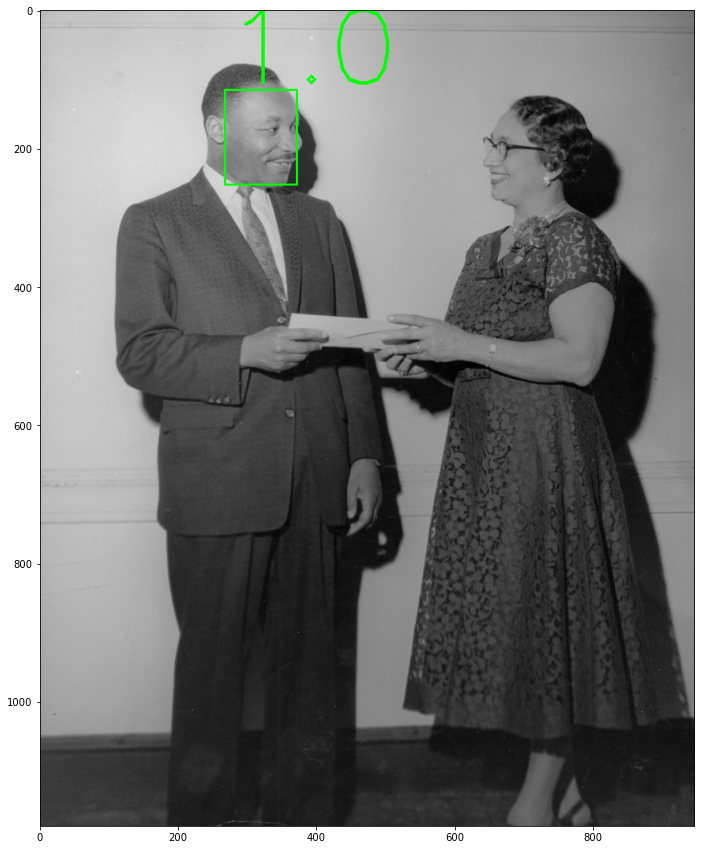



 neu_129528-highres.jpg  size:  (807, 1180, 3)


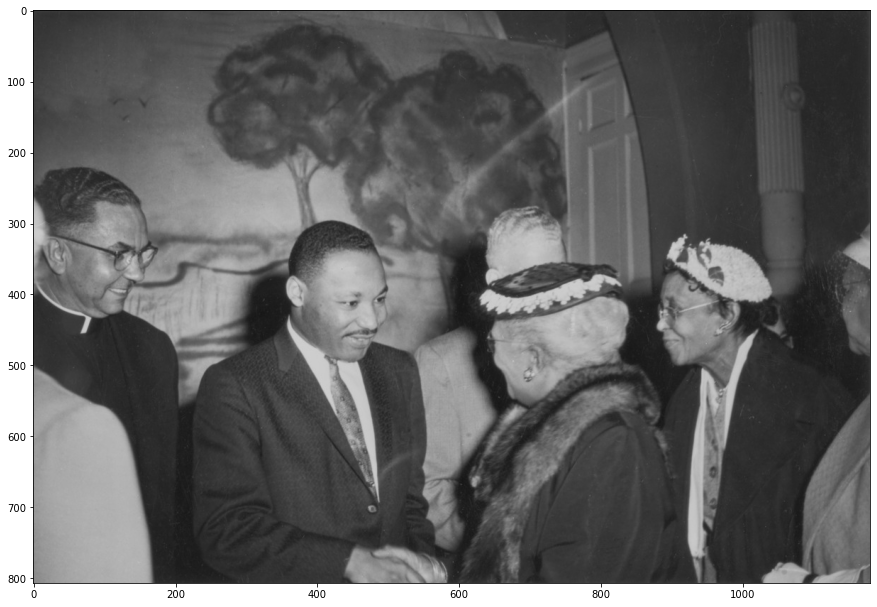



Detector Model Used:  opencv
Face Detection Confidence score:  3.1494510855409317
Model Run Time:  0.15  seconds


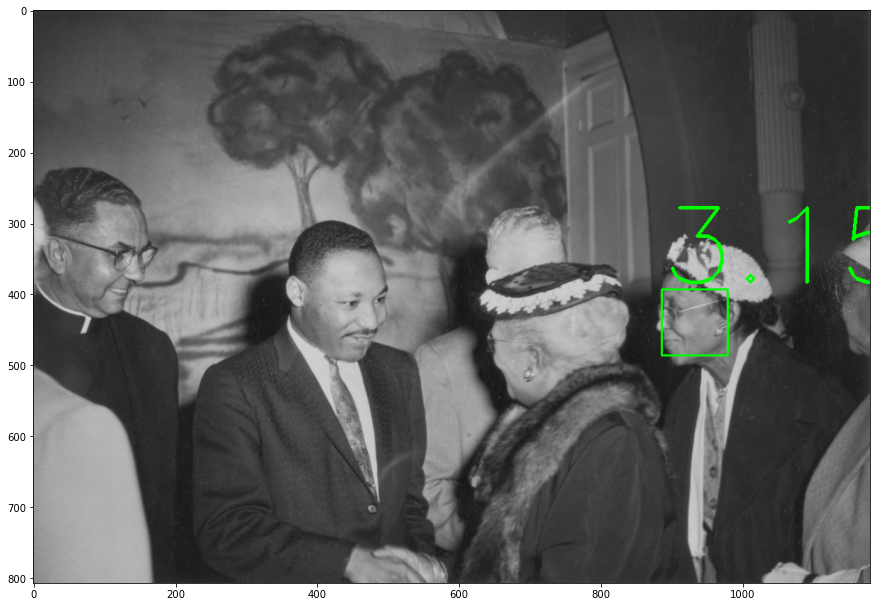



Detector Model Used:  ssd
Face Detection Confidence score:  0
Model Run Time:  0.04  seconds


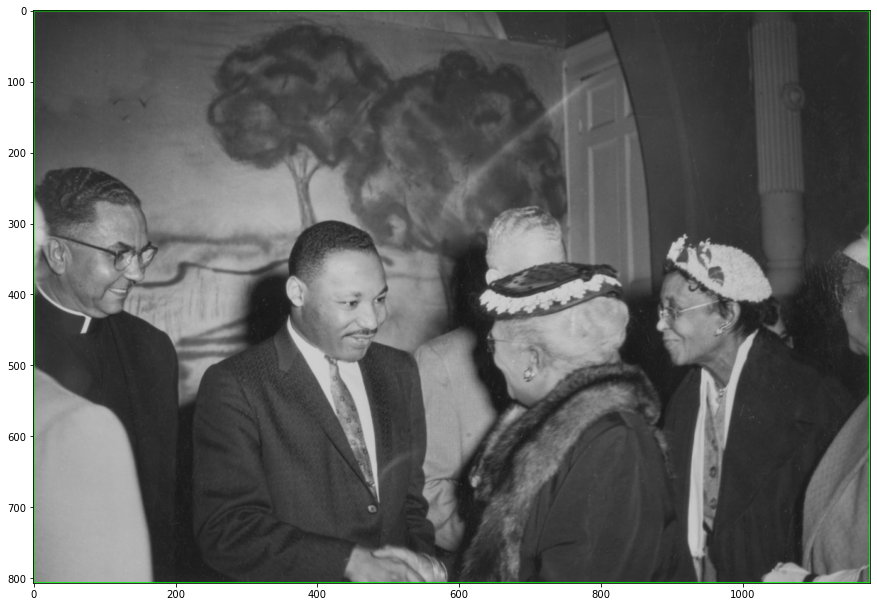



Detector Model Used:  mtcnn
1/1 [==============================] - 0s 26ms/step
Face Detection Confidence score:  0.9984519481658936
Face Detection Confidence score:  0.9904961585998535
Face Detection Confidence score:  0.9354780912399292
Model Run Time:  0.92  seconds


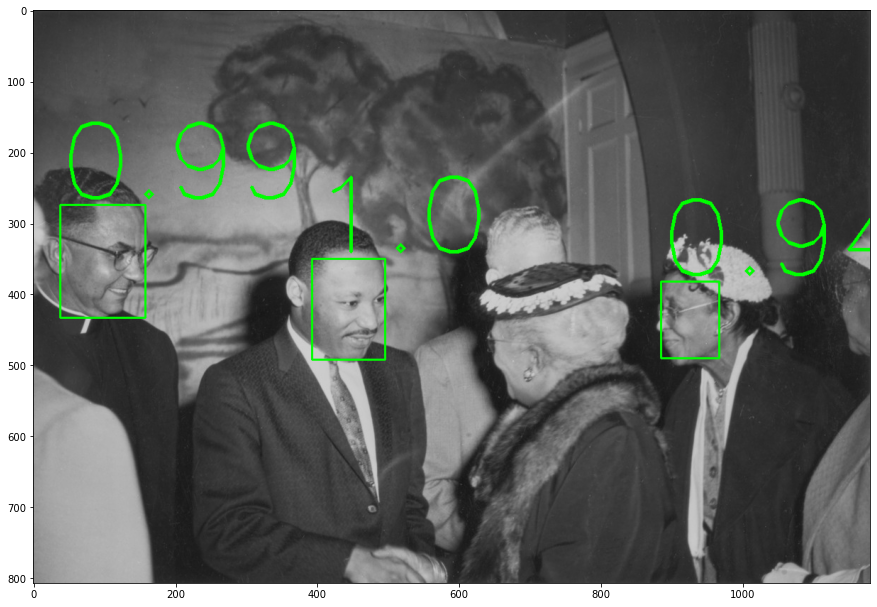



 neu_m039md26w-master.jpg  size:  (5984, 4840, 3)


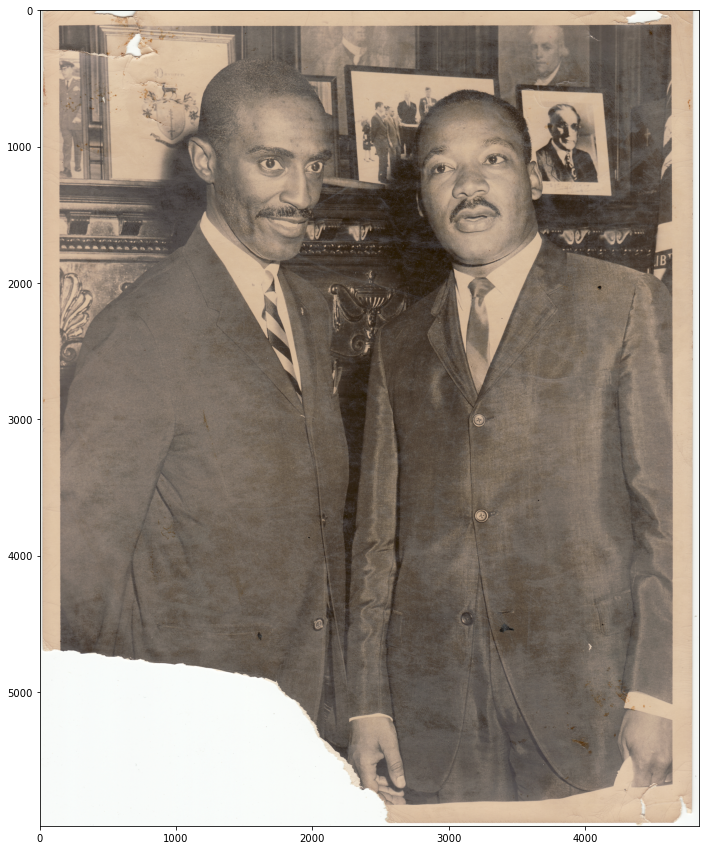



Detector Model Used:  opencv
Face Detection Confidence score:  1.805802276241593
Face Detection Confidence score:  6.869442983705085
Face Detection Confidence score:  4.043026118713897
Face Detection Confidence score:  8.001350036531221
Face Detection Confidence score:  2.0877270571654662
Face Detection Confidence score:  2.016805074585136
Model Run Time:  2.91  seconds


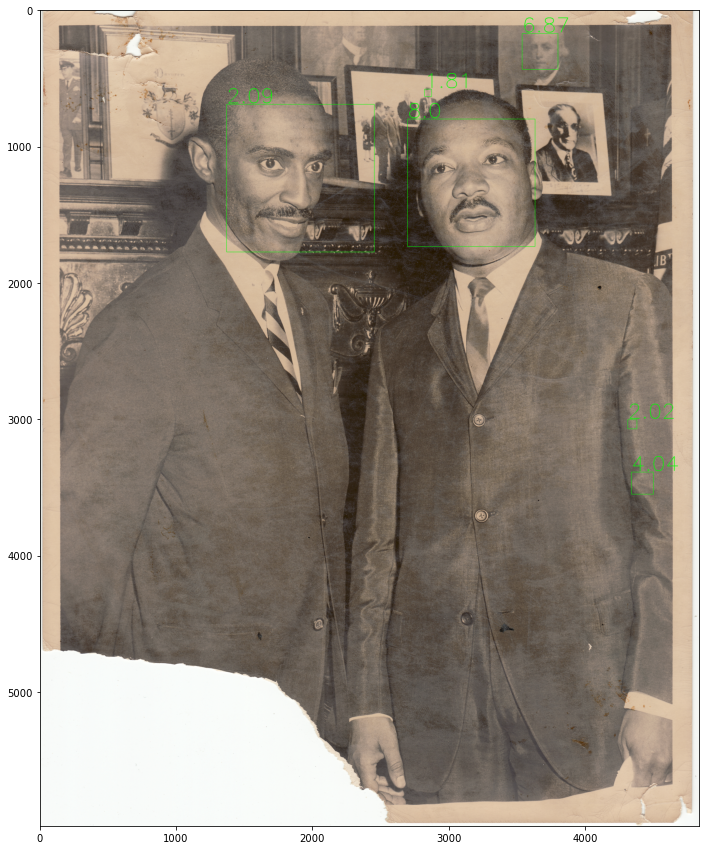



Detector Model Used:  ssd
Face Detection Confidence score:  0.9956833124160767
Face Detection Confidence score:  0.9911942481994629
Model Run Time:  0.35  seconds


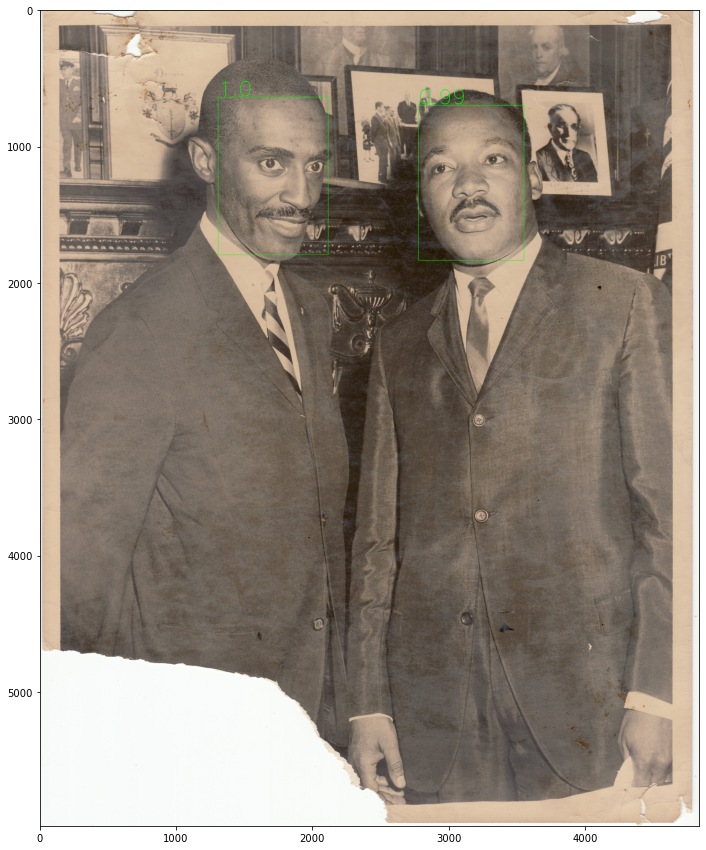



Detector Model Used:  mtcnn
3/3 [==============================] - 0s 14ms/step
Face Detection Confidence score:  0.9988435506820679
Face Detection Confidence score:  0.9982080459594727
Face Detection Confidence score:  0.9918100237846375
Face Detection Confidence score:  0.965094268321991
Model Run Time:  8.03  seconds


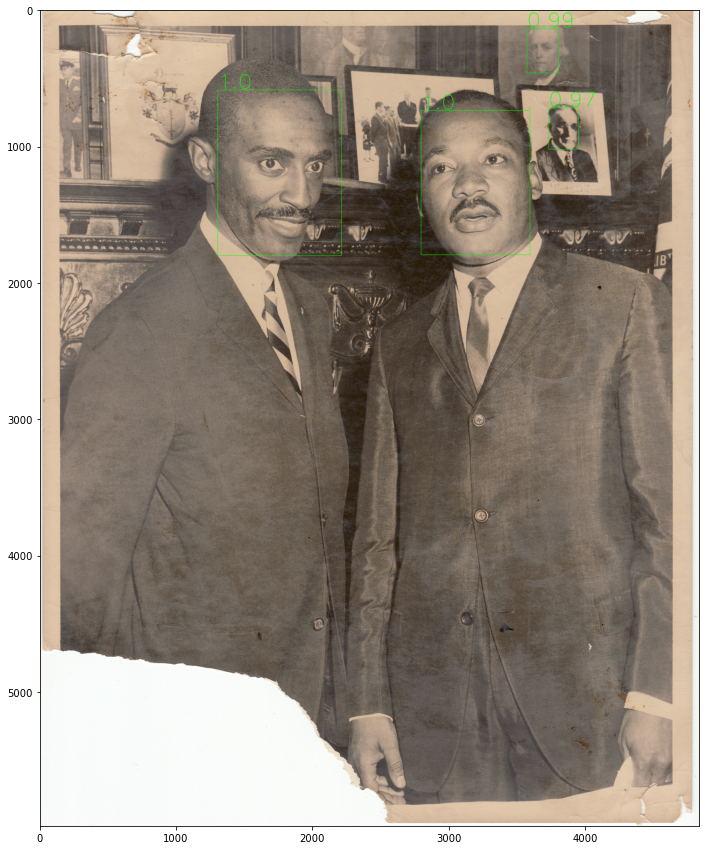



 sidney-poitier.jpg  size:  (640, 960, 3)


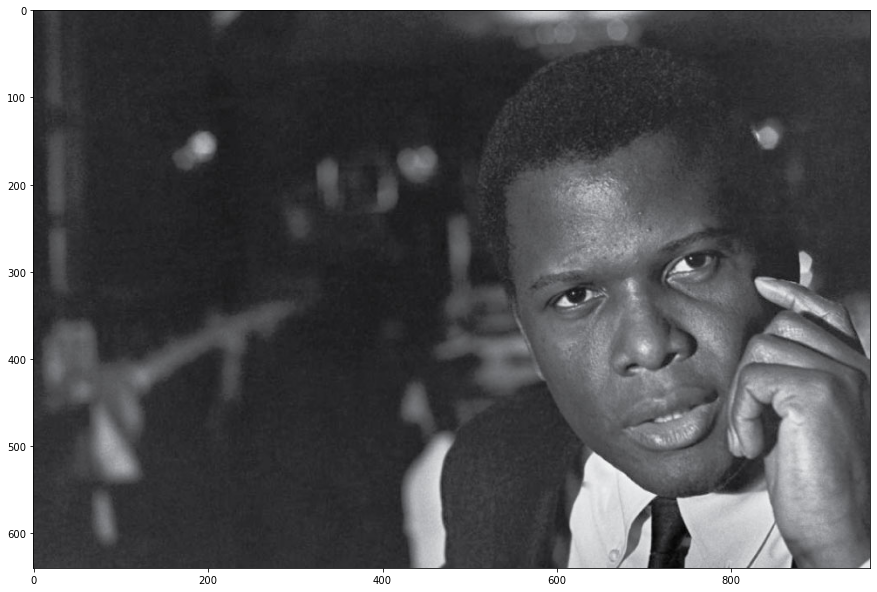



Detector Model Used:  opencv
Face Detection Confidence score:  0
Model Run Time:  0.07  seconds


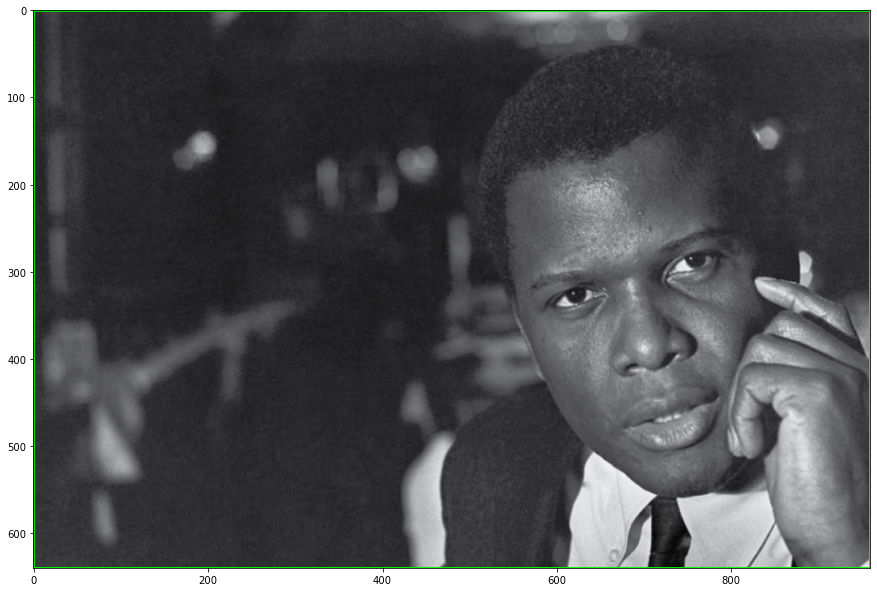



Detector Model Used:  ssd
Face Detection Confidence score:  0.9988993406295776
Model Run Time:  0.09  seconds


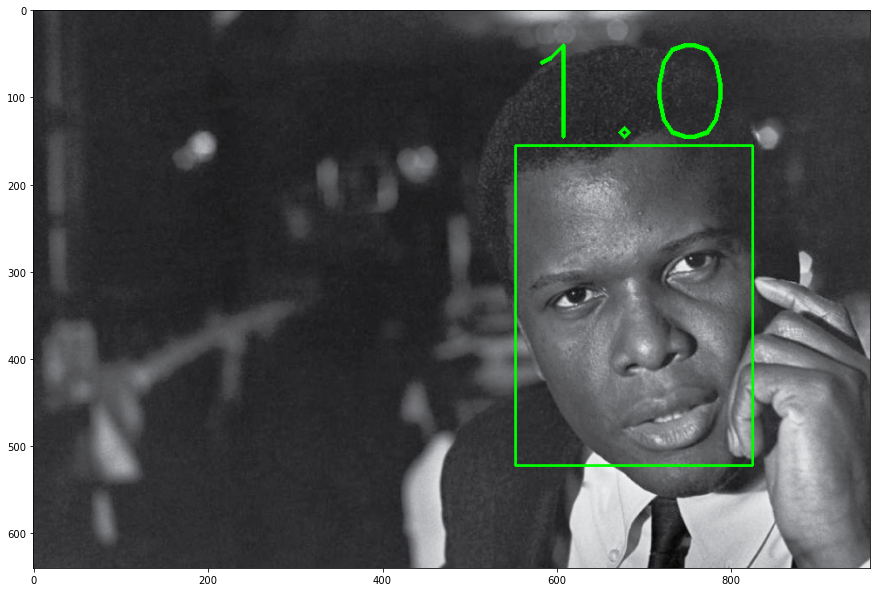



Detector Model Used:  mtcnn
1/1 [==============================] - 0s 21ms/step
Face Detection Confidence score:  0.9836808443069458
Model Run Time:  0.79  seconds


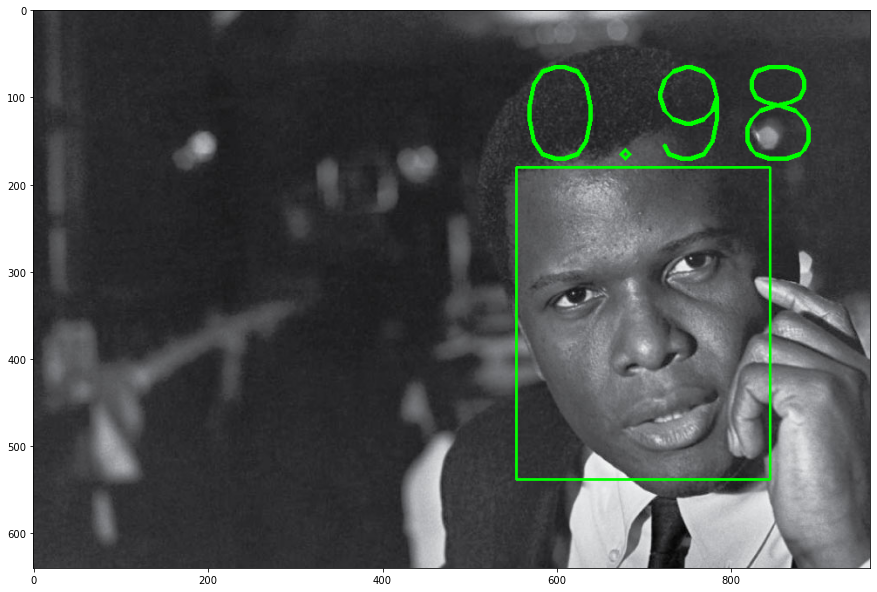

In [7]:
import cv2
from deepface import DeepFace
import matplotlib.pyplot as plt
import time
import os


#img_path = './TestImages/database/neu_m039md26w-master.jpg'
#img_path = './TestImages/database/neu_129523-highres.jpg'
#img_path = './TestImages/database/neu_129528-highres.jpg'
detectors = ['opencv','ssd','mtcnn']


img_path = './TestImages/database/'
for entry in os.scandir(img_path):
    #print(entry.path)
    if entry.name.endswith('.pkl'):
        continue
    image = cv2.imread(entry.path)
    print('\n\n',entry.name,' size: ',image.shape)
    #show the original image
    plt.figure(figsize=(15,15))
    plt.imshow(image[:,:,::-1]) #reads in reverse RGB for some reason, so need to reverse it
    plt.show()


    for detector in detectors:
        print('\n\nDetector Model Used: ',detector)
        #for timing detection
        tic = time.time()
        img = DeepFace.extract_faces(img_path=image,detector_backend = detector,enforce_detection=False)
        #img is a list of dictionaries, each item corresponds to a detected face
        toc = time.time()
        #copy image so we can draw boxes on it
        imgwithbox=image.copy()
        #loop through the detected faces
        for i in img:
            f_a = i['facial_area']
            #draw a box, use the bottom left x,y and top right x,y coordinates, tuple for color, and last parameter is box line thickness
            imgwithbox=cv2.rectangle(imgwithbox,(f_a['x'],f_a['y']),(f_a['x']+f_a['w'],f_a['y']+f_a['h']),(0,255,0),2)
            #add confidence score text to box
            cv2.putText(imgwithbox, str(round(i['confidence'],2)), (f_a['x'], f_a['y']-10), cv2.FONT_HERSHEY_SIMPLEX, 5, (0,255,0), 4)
            print('Face Detection Confidence score: ',i['confidence'])
        print('Model Run Time: ',round(toc-tic,2),' seconds')
        #show the image with the detected faces
        plt.figure(figsize=(15,15))
        plt.imshow(imgwithbox[:,:,::-1])
        plt.show()